In [57]:
import pandas as pd

# Load the data from the CSV file
df = pd.read_csv('case6_smaller.csv')

# Display the first few rows to understand the structure
# display(df.head())

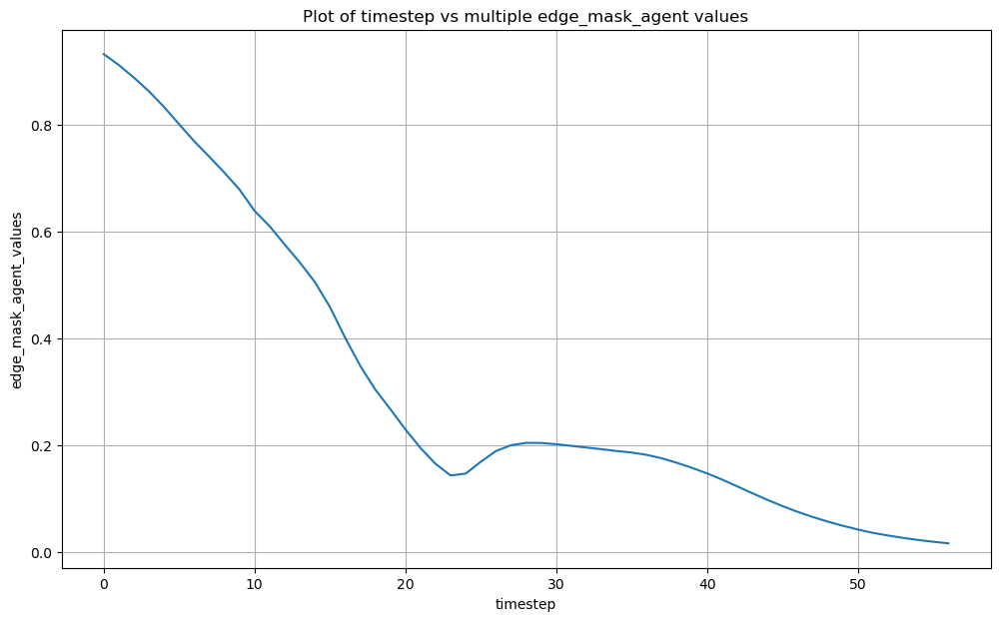

In [58]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 7))
plt.plot(df['timestep'], df['edge_mask_2'], label='edge_mask_2')

plt.xlabel('timestep')
plt.ylabel('edge_mask_agent_values')
plt.title('Plot of timestep vs multiple edge_mask_agent values')
plt.grid(True)
plt.show()

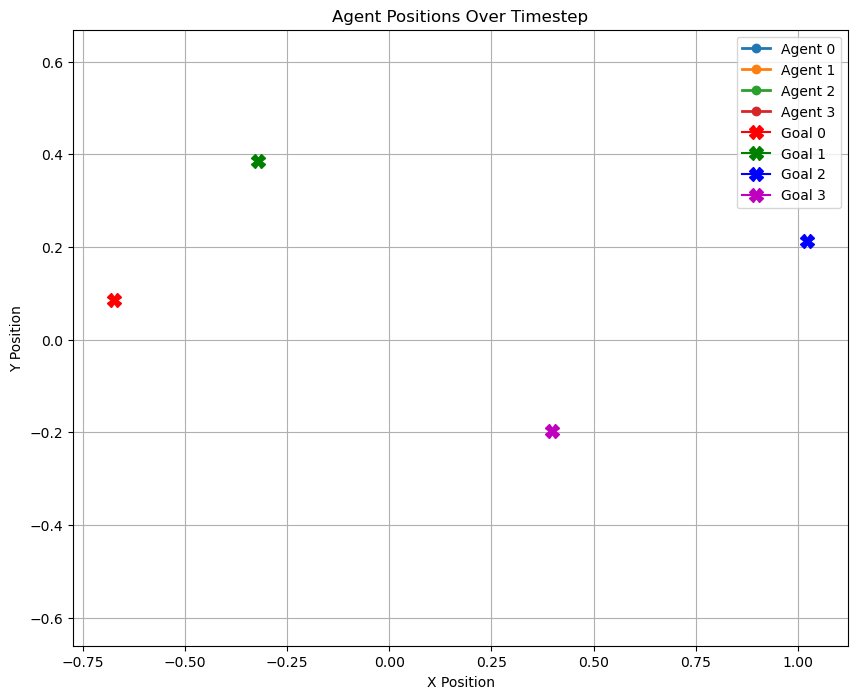

Goal 0: (-0.673, 0.086)
Goal 1: (-0.320, 0.384)
Goal 2: (1.023, 0.213)
Goal 3: (0.398, -0.197)


In [59]:
import matplotlib.pyplot as plt
agent_positions = df[['timestep',
                      'obs_0', 'obs_1',          # Agent 0 pos (x, y)
                      'obs_4', 'obs_5',          # Agent 0 goal (x, y)
                      'obs_6', 'obs_7',          # Agent 1 pos
                      'obs_10', 'obs_11',        # Agent 1 goal
                      'obs_12', 'obs_13',        # Agent 2 pos
                      'obs_16', 'obs_17',        # Agent 2 goal
                      'obs_18', 'obs_19',        # Agent 3 pos
                      'obs_22', 'obs_23']]       # Agent 3 goal

fig, ax = plt.subplots(figsize=(10, 8))

# Determine axis limits
x_min = df[['obs_0','obs_6','obs_12','obs_18','obs_4','obs_10','obs_16','obs_22']].min().min()
x_max = df[['obs_0','obs_6','obs_12','obs_18','obs_4','obs_10','obs_16','obs_22']].max().max()
y_min = df[['obs_1','obs_7','obs_13','obs_19','obs_5','obs_11','obs_17','obs_23']].min().min()
y_max = df[['obs_1','obs_7','obs_13','obs_19','obs_5','obs_11','obs_17','obs_23']].max().max()

ax.set_xlim(x_min - 0.1, x_max + 0.1)
ax.set_ylim(y_min - 0.1, y_max + 0.1)

# Initialize lines for each agent
lines = []
for i in range(4):
    line, = ax.plot([], [], 'o-', lw=2, label=f'Agent {i}')
    lines.append(line)

# Plot goal locations as static markers
goal_colors = ['r', 'g', 'b', 'm']
goal_x_cols = ['obs_4', 'obs_10', 'obs_16', 'obs_22']
goal_y_cols = ['obs_5', 'obs_11', 'obs_17', 'obs_23']

for i in range(4):
    goal_x = agent_positions[goal_x_cols[i]].iloc[0]   # goal stays constant
    goal_y = agent_positions[goal_y_cols[i]].iloc[0]
    ax.plot(goal_x, goal_y, marker='X', markersize=10, color=goal_colors[i], label=f'Goal {i}')

ax.set_title('Agent Positions Over Timestep')
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.legend()
ax.grid(True)

plt.show()

for i, (gx, gy) in enumerate(zip(['obs_4','obs_10','obs_16','obs_22'],
                                 ['obs_5','obs_11','obs_17','obs_23'])):
    print(f"Goal {i}: ({df[gx].iloc[0]:.3f}, {df[gy].iloc[0]:.3f})")

var_plus=0.957696, var_minus=1.55026e-15 -> using pos - rel


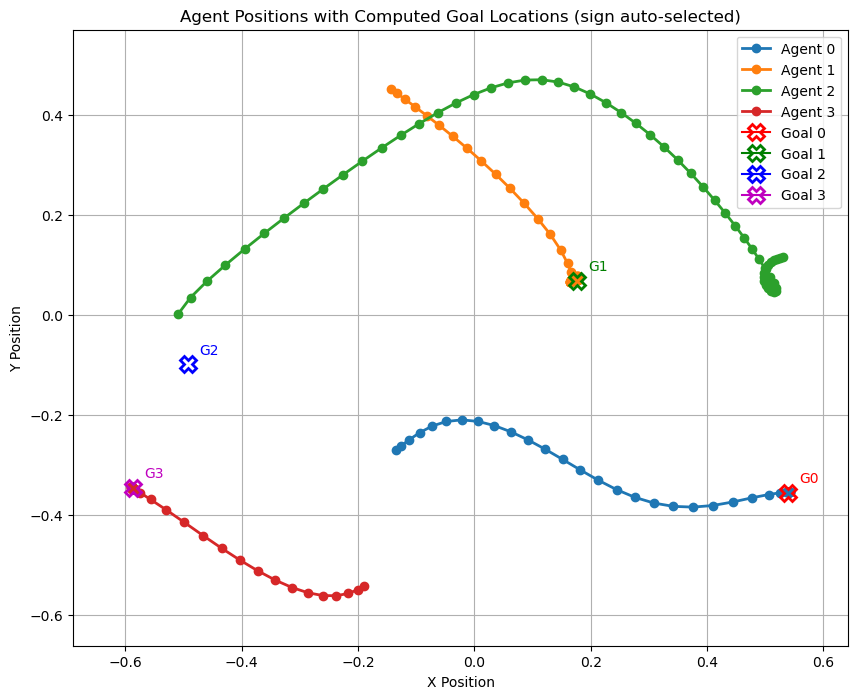

Goal 0: (0.539, -0.355)
Goal 1: (0.177, 0.069)
Goal 2: (-0.492, -0.098)
Goal 3: (-0.587, -0.345)


In [60]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# --- column groups (6 per agent): [x, y, vx, vy, rel_x, rel_y]
pos_x_cols = [f'obs_{6*i}'   for i in range(4)]
pos_y_cols = [f'obs_{6*i+1}' for i in range(4)]
rel_x_cols = [f'obs_{6*i+4}' for i in range(4)]
rel_y_cols = [f'obs_{6*i+5}' for i in range(4)]

# Build DataFrame with two hypotheses
df_plus  = pd.DataFrame()
df_minus = pd.DataFrame()
for i in range(4):
    px, py = df[pos_x_cols[i]], df[pos_y_cols[i]]
    rx, ry = df[rel_x_cols[i]], df[rel_y_cols[i]]
    df_plus [f'goal_{i}_x'] = px + rx  # hypothesis A: rel = goal - pos
    df_plus [f'goal_{i}_y'] = py + ry
    df_minus[f'goal_{i}_x'] = px - rx  # hypothesis B: rel = pos - goal
    df_minus[f'goal_{i}_y'] = py - ry

# Compute temporal variance of each goal (should be ~0 if correct)
def total_goal_variance(d):
    v = 0.0
    for i in range(4):
        v += d[f'goal_{i}_x'].var() + d[f'goal_{i}_y'].var()
    return float(v)

var_plus  = total_goal_variance(df_plus)
var_minus = total_goal_variance(df_minus)
use_plus = var_plus < var_minus
print(f"var_plus={var_plus:.6g}, var_minus={var_minus:.6g} -> using {'pos + rel' if use_plus else 'pos - rel'}")

# Choose the consistent goals
goals = df_plus if use_plus else df_minus

# Axis limits from positions + goals
x_all = pd.concat([df[pos_x_cols], goals[[f'goal_{i}_x' for i in range(4)]]], axis=1)
y_all = pd.concat([df[pos_y_cols], goals[[f'goal_{i}_y' for i in range(4)]]], axis=1)
x_min, x_max = x_all.min().min(), x_all.max().max()
y_min, y_max = y_all.min().min(), y_all.max().max()

fig, ax = plt.subplots(figsize=(10, 8))
ax.set_xlim(x_min - 0.1, x_max + 0.1)
ax.set_ylim(y_min - 0.1, y_max + 0.1)

# Plot agent trajectories
for i in range(4):
    ax.plot(df[pos_x_cols[i]], df[pos_y_cols[i]], 'o-', lw=2, label=f'Agent {i}', zorder=2)

# Plot goals (from first timestep; they should be constant anyway)
goal_colors = ['r','g','b','m']
for i, color in enumerate(goal_colors):
    gx = goals[f'goal_{i}_x'].iloc[0]
    gy = goals[f'goal_{i}_y'].iloc[0]
    ax.plot(gx, gy, marker='X', markersize=12, markerfacecolor='none',
            markeredgewidth=2, color=color, label=f'Goal {i}', zorder=3)
    ax.text(gx + 0.02, gy + 0.02, f"G{i}", fontsize=10, color=color, zorder=4)

ax.set_title('Agent Positions with Computed Goal Locations (sign auto-selected)')
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.grid(True)
ax.legend()
plt.show()

# Print the final goals used
for i in range(4):
    print(f"Goal {i}: ({goals[f'goal_{i}_x'].iloc[0]:.3f}, {goals[f'goal_{i}_y'].iloc[0]:.3f})")



In [61]:
def update(frame):
    """Updates the data for each line in the plot for every timestep."""
    for i in range(4):
        # Extract x and y positions for the current frame for each agent
        x_pos = agent_positions.loc[frame, f'obs_{i*6}']
        y_pos = agent_positions.loc[frame, f'obs_{i*6 + 1}']

        # Update the data for the corresponding line
        lines[i].set_data([x_pos], [y_pos])

    return lines

In [62]:
from matplotlib.animation import FuncAnimation

ani = FuncAnimation(fig, update, frames=len(agent_positions), blit=True)

In [63]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

ani = FuncAnimation(fig, update, frames=len(agent_positions), blit=True)
# Use jshtml instead of html5_video to avoid requiring ffmpeg
html_anim = ani.to_jshtml()
display(HTML(html_anim))

Using pos - rel for goal computation


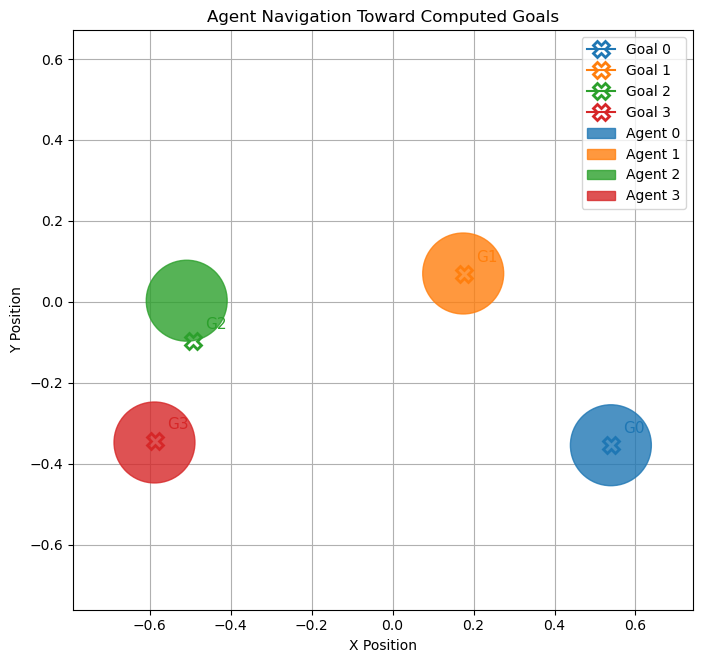

In [64]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import pandas as pd
import numpy as np

AGENT_RADIUS = 0.1  # matches agent_radius in make_world

# --- Column setup ---
pos_x_cols = [f'obs_{6*i}'   for i in range(4)]
pos_y_cols = [f'obs_{6*i+1}' for i in range(4)]
rel_x_cols = [f'obs_{6*i+4}' for i in range(4)]
rel_y_cols = [f'obs_{6*i+5}' for i in range(4)]

# --- Compute goal both ways to auto-determine correct sign ---
df_plus  = pd.DataFrame()
df_minus = pd.DataFrame()
for i in range(4):
    px, py = df[pos_x_cols[i]], df[pos_y_cols[i]]
    rx, ry = df[rel_x_cols[i]], df[rel_y_cols[i]]
    df_plus [f'goal_{i}_x'] = px + rx
    df_plus [f'goal_{i}_y'] = py + ry
    df_minus[f'goal_{i}_x'] = px - rx
    df_minus[f'goal_{i}_y'] = py - ry

def total_var(d):
    return sum(d[f'goal_{i}_x'].var() + d[f'goal_{i}_y'].var() for i in range(4))

use_plus = total_var(df_plus) < total_var(df_minus)
goals = df_plus if use_plus else df_minus
print(f"Using {'pos + rel' if use_plus else 'pos - rel'} for goal computation")

# --- Axis limits ---
x_all = pd.concat([df[pos_x_cols], goals[[f'goal_{i}_x' for i in range(4)]]], axis=1)
y_all = pd.concat([df[pos_y_cols], goals[[f'goal_{i}_y' for i in range(4)]]], axis=1)
x_min, x_max = x_all.min().min(), x_all.max().max()
y_min, y_max = y_all.min().min(), y_all.max().max()

# --- Setup figure (equal aspect so circles render correctly) ---
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_aspect('equal')
ax.set_xlim(x_min - 0.2, x_max + 0.2)
ax.set_ylim(y_min - 0.2, y_max + 0.2)
ax.set_title('Agent Navigation Toward Computed Goals')
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.grid(True)

# --- Define consistent colors ---
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']

# --- Static goal markers ---
for i, color in enumerate(colors):
    gx = goals[f'goal_{i}_x'].iloc[0]
    gy = goals[f'goal_{i}_y'].iloc[0]
    ax.plot(gx, gy, marker='X', markersize=12, color=color,
            markeredgewidth=2, markerfacecolor='none', label=f'Goal {i}', zorder=3)
    ax.text(gx + 0.03, gy + 0.03, f"G{i}", fontsize=11, color=color)

# --- Agent circles sized to match simulation (radius=0.1 world units) ---
circles = []
for i, color in enumerate(colors):
    x0 = df.loc[0, pos_x_cols[i]]
    y0 = df.loc[0, pos_y_cols[i]]
    circle = Circle((x0, y0), radius=AGENT_RADIUS, color=color,
                    alpha=0.8, label=f'Agent {i}', zorder=4)
    ax.add_patch(circle)
    circles.append(circle)

ax.legend()

# --- Animation update function ---
def update(frame):
    for i in range(4):
        x_pos = df.loc[frame, pos_x_cols[i]]
        y_pos = df.loc[frame, pos_y_cols[i]]
        circles[i].set_center((x_pos, y_pos))
    return circles

# --- Create and display animation ---
ani = FuncAnimation(fig, update, frames=len(df), blit=True)
html_anim = ani.to_jshtml()
HTML(html_anim)